# Βασικές τεχνικές φιλτραρίσματος στο πεδίο της συχνότητας

In [49]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow #this is used for imshow to work on google colab
from google.colab import drive
import sys
import os

drive.mount('/content/gdrive')
lib_file_location = "/content/gdrive/My Drive/Courses/TEL 750 - Digital Image Processing/"
sys.path.append(lib_file_location)
#from resize import ResizeWithAspectRatio

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Initial dimensions 800 X 800


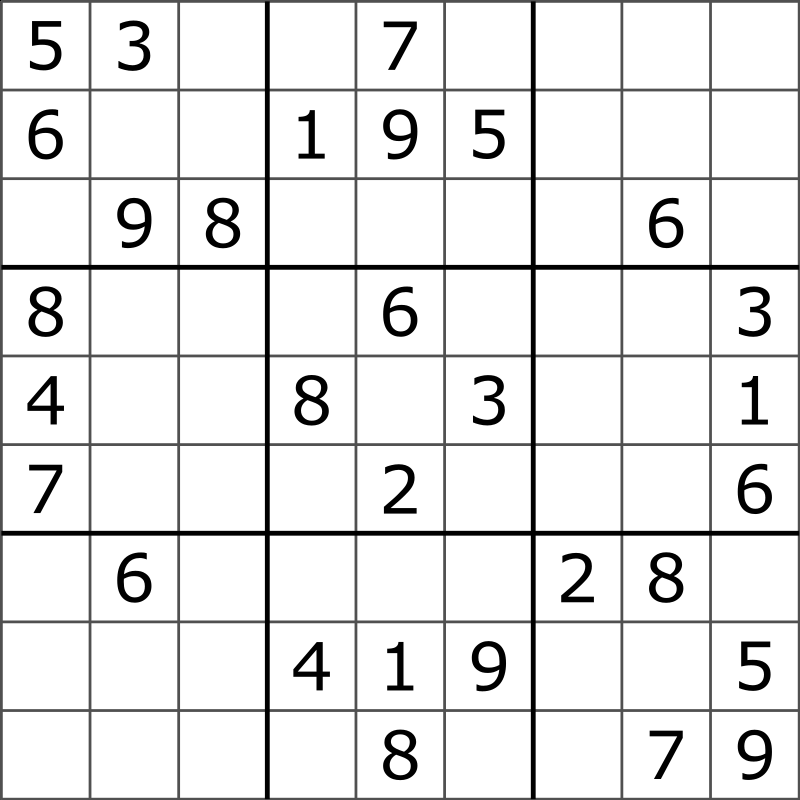

In [50]:
# Read / Show an image
img_file = '/content/gdrive/MyDrive/Courses/TEL 750 - Digital Image Processing/sudoku.png'
image = cv2.imread(img_file) # this image is in BGR format

# Resize using my own resize function
#image = ResizeWithAspectRatio(image, height=200)

# Convert image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
print('Initial dimensions', gray_image.shape[0], 'X', gray_image.shape[1])
cv2_imshow(gray_image)

## Υπολογισμός του φάσματος της εικόνας

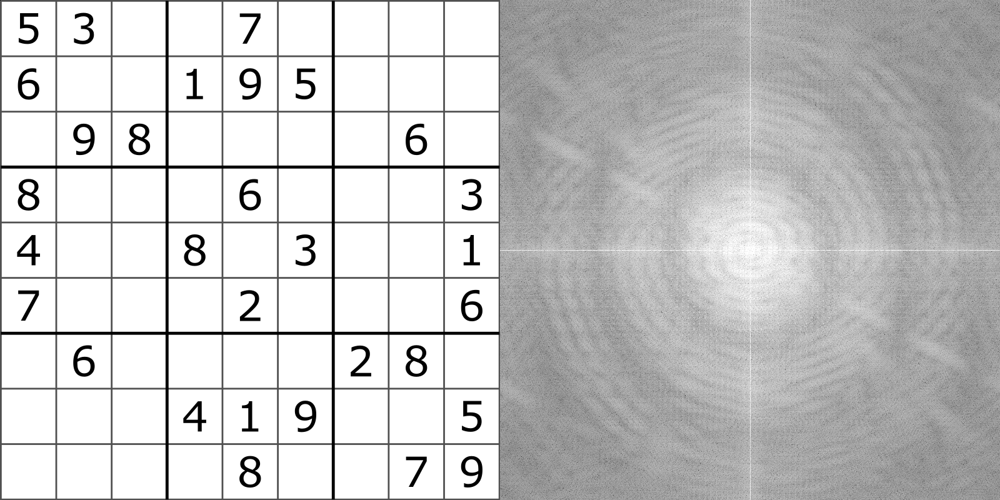

In [51]:
f = np.fft.fft2(gray_image)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))

res = np.hstack((gray_image, magnitude_spectrum))
cv2_imshow(res)

## Παραδείγματα βασικών συνθετικών εικόνων

### Παράδειγμα #1 - Μία ακμή

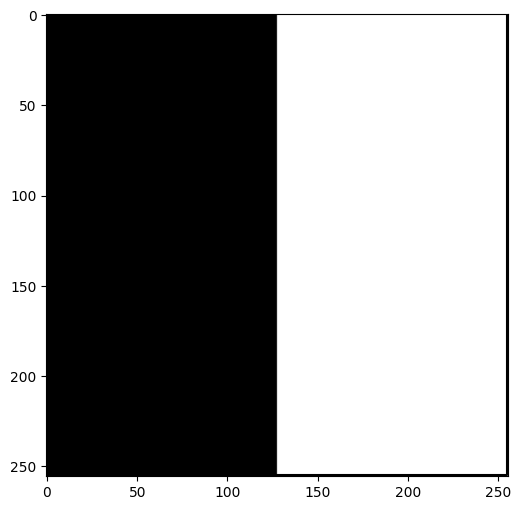

In [52]:
# generate an image

N = 2**8
a = np.hstack((np.zeros((N,int(N/2))), np.ones((N,int(N/2)))))
a = np.asmatrix(a)

plt.figure(figsize = (10,6))
plt.imshow(a, cmap = 'gray')

# just for plotting a boundary

m = a.shape[0]

w = [0, 0]
x = [0, m-1]
y = [m-1, m-1]
z = [m-1, 0]

boundary = np.vstack([w, x, y, z])
boundary = np.asmatrix(boundary)

plt.plot(boundary[:,0], boundary[:,1], 'k-')

plt.show()

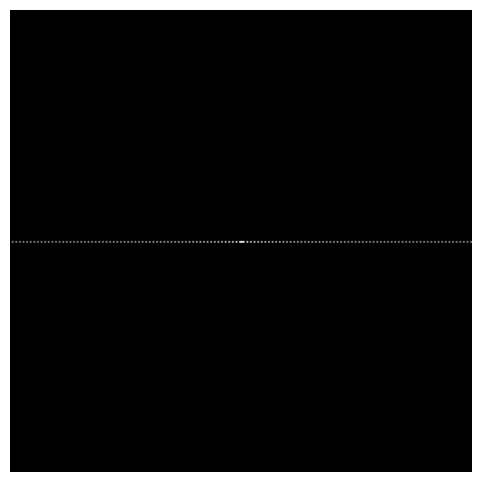

In [53]:
# Fourier Transformation with Image

Ak = np.fft.fft2(a)
As = np.fft.fftshift(Ak)

plt.figure(figsize = (10,6))
plt.imshow(np.log(1+np.absolute(As)), cmap = 'gray')
plt.axis('off')
plt.show()

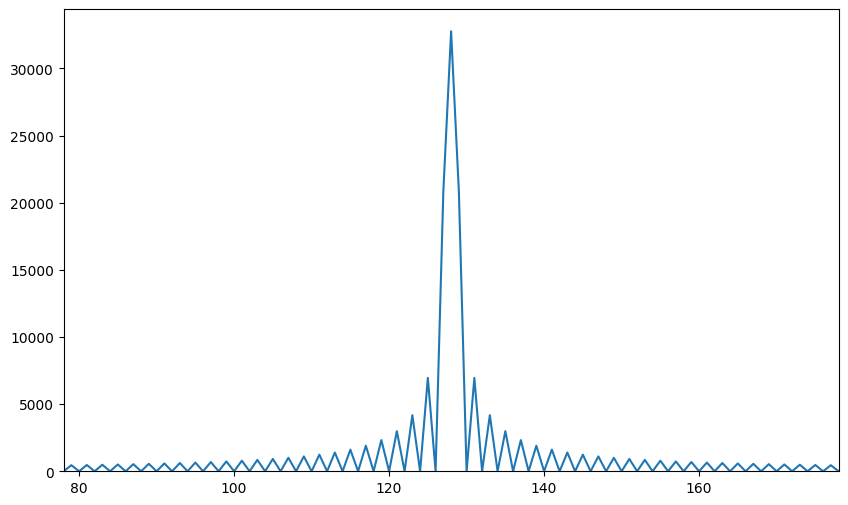

In [54]:
L = np.absolute(As)

plt.figure(figsize = (10,6))
plt.plot(np.arange(L.shape[0]), L[int(N/2),:])
plt.xlim(int(N/2)-50, int(N/2)+50)
plt.ylim(bottom = 0)

plt.show()

### Παράδειγμα #2 - Κατακόρυφες γραμμές

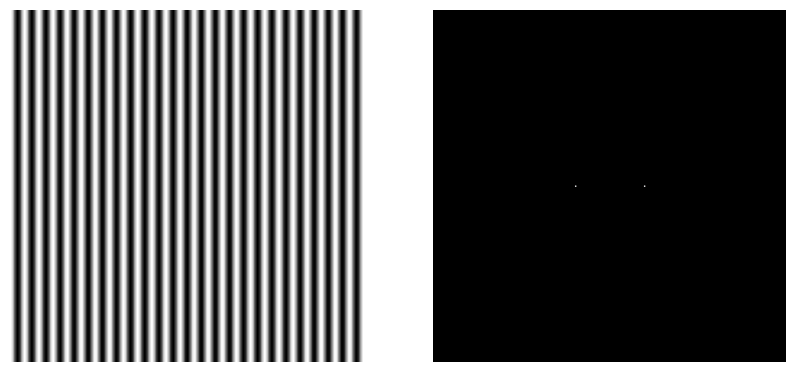

In [55]:
N = 2**8
x, y = np.meshgrid(np.arange(N), np.arange(N))

k = 25
m = np.cos(2*np.pi/N*k*x)

M = np.fft.fft2(m)
Ms = np.fft.fftshift(M)

plt.figure(figsize = (10,6))

plt.subplot(1,2,1)
plt.imshow(m, cmap = 'gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(np.log(1+np.absolute(Ms)), cmap = 'gray')
plt.axis('off')

plt.show()

### Παράδειγμα #3 - Οριζόντιες γραμμές

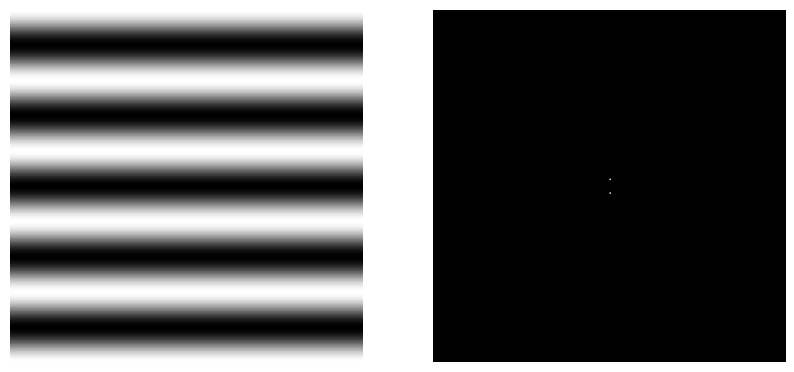

In [56]:
N = 2**8
x, y = np.meshgrid(np.arange(N), np.arange(N))

k = 5
m = np.cos(2*np.pi/N*k*y)

M = np.fft.fft2(m)
Ms = np.fft.fftshift(M)

plt.figure(figsize = (10,6))

plt.subplot(1,2,1)
plt.imshow(m, cmap = 'gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(np.log(1+np.absolute(Ms)), cmap = 'gray')
plt.axis('off')

plt.show()

### Παράδειγμα 4 - Διαγώνιες γραμμές

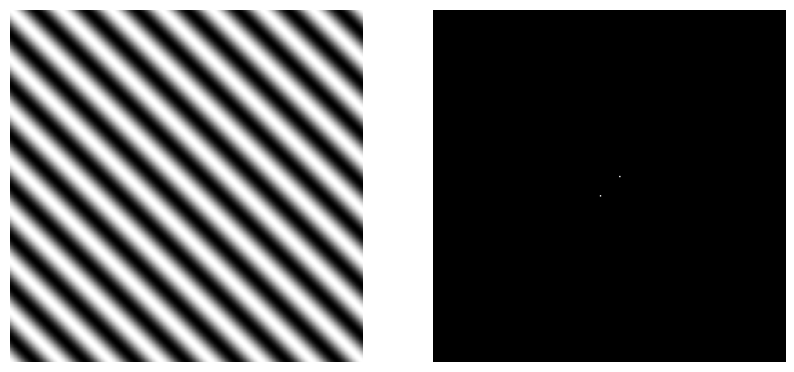

In [57]:
N = 2**8
x, y = np.meshgrid(np.arange(N), np.arange(N))

k = 7
m = np.cos(2*np.pi/N*k*(x-y))

M = np.fft.fft2(m)
Ms = np.fft.fftshift(M)

plt.figure(figsize = (10,6))

plt.subplot(1,2,1)
plt.imshow(m, cmap = 'gray')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(np.log(1+np.absolute(Ms)), cmap = 'gray')
plt.axis('off')

plt.show()

### Παράδειγμα 5 - Μια βηματική στον χώρο

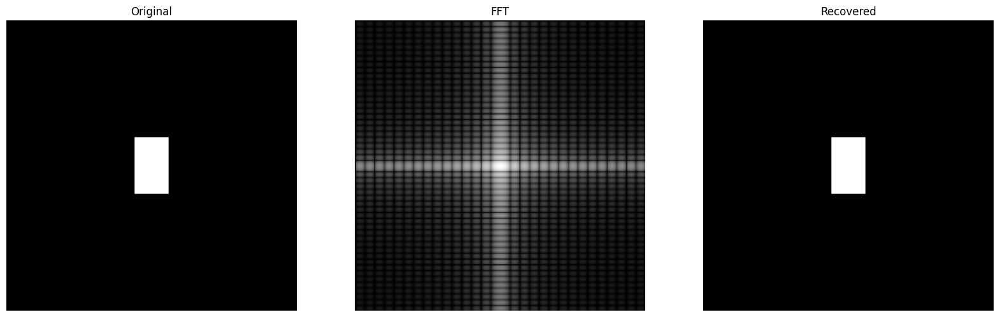

In [58]:
# sqaure (box) image and its fft

N = 2**8
a = np.zeros([N,N])
a[int(N/2)-25 : int(N/2)+25, int(N/2)-15 : int(N/2)+15] = 1

As = np.fft.fftshift(np.fft.fft2(a))

# inverse fft (recovered image)

Ar = np.fft.ifftshift(As)
ar = np.real(np.fft.ifft2(Ar))

plt.figure(figsize = (20,6))

plt.subplot(1,3,1)
plt.title('Original')
plt.imshow(a, cmap = 'gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title('FFT')
plt.imshow(np.log(1+np.absolute(As)), cmap = 'gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title('Recovered')
plt.imshow(ar, cmap = 'gray')
plt.axis('off')

plt.show()

### Παράδειγμα 6 - Ένα περιστραμμένο κουτί

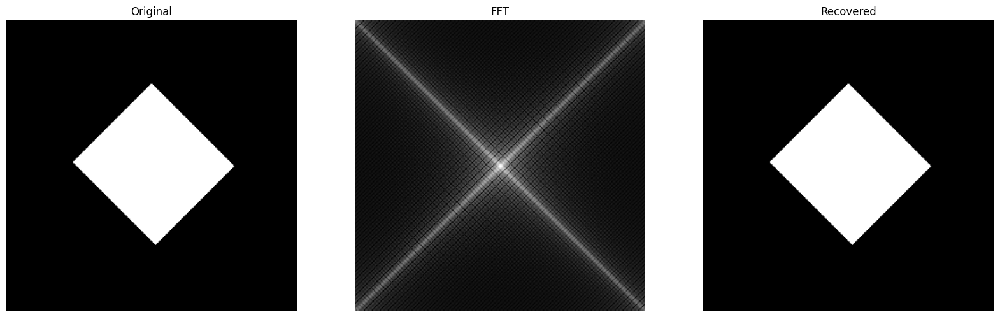

In [59]:
# a box rotated 45 degree

x, y = np.meshgrid(np.arange(N), np.arange(N))
b = (x + y < 329) & (x + y > 182) & (x - y > -67) & (x - y < 73)
Bs = np.fft.fftshift(np.fft.fft2(b))

# inverse fft

Br = np.fft.ifftshift(Bs)
br = np.fft.ifft2(Br)

plt.figure(figsize = (20,6))

plt.subplot(1,3,1)
plt.title('Original')
plt.imshow(b, cmap = 'gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title('FFT')
plt.imshow(np.log(1+np.absolute(Bs)), cmap = 'gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title('Recovered')
plt.imshow(np.real(br), cmap = 'gray')
plt.axis('off')

plt.show()

### Παράδειγμα 7 - Ένας κύκλος

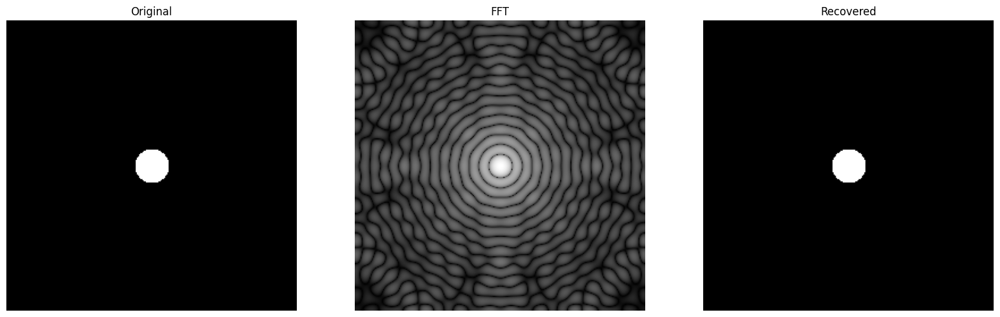

In [60]:
# circle

x, y = np.meshgrid(np.arange(-int(N/2), int(N/2), 1), np.arange(-int(N/2), int(N/2), 1))
z = np.sqrt(x**2 + y**2)

c = z < 15
Cs = np.fft.fftshift(np.fft.fft2(c))

# inverse fft

Cr = np.fft.ifftshift(Cs)
cr = np.fft.ifft2(Cr)

plt.figure(figsize = (20,6))

plt.subplot(1,3,1)
plt.title('Original')
plt.imshow(c, cmap = 'gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title('FFT')
plt.imshow(np.log(1+np.absolute(Cs)), cmap = 'gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title('Recovered')
plt.imshow(np.real(cr), cmap = 'gray')
plt.axis('off')

plt.show()

# Χαμηλοπερατά φίλτρα στο πεδίο της συχνότητας

## Ιδανικό χαμηλοπερατό φίλτρο (Ideal Lowpass Filter)

In [61]:
def distance(point1,point2):
    return np.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def idealLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
          if (distance((y,x),center)<D0):
            base[y,x] = 1
    return base

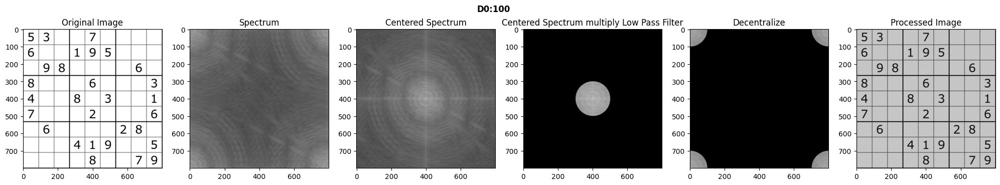

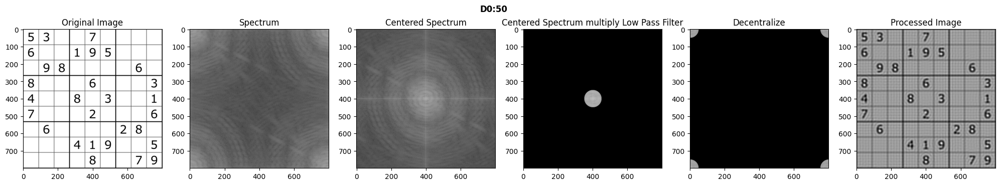

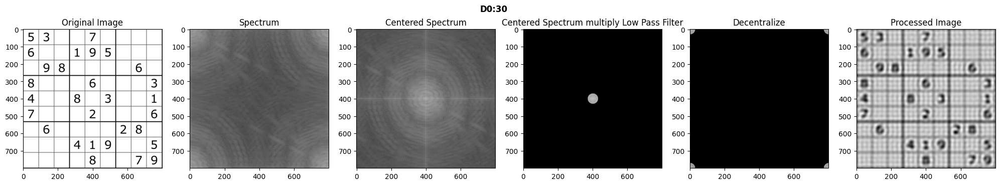

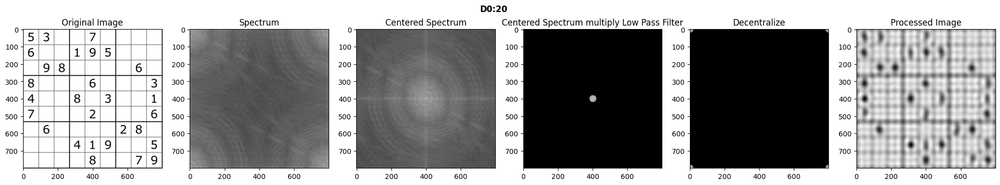

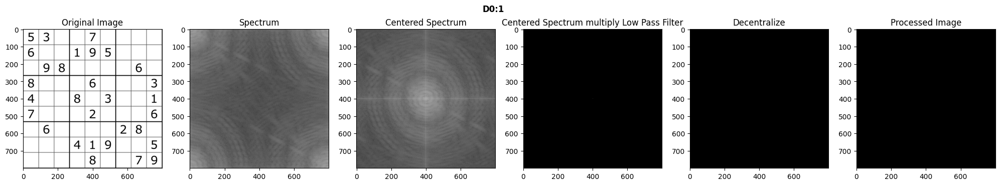

In [62]:
def try_d0s_lp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    LowPassCenter = center*idealLP(d0,img.shape)
    plt.subplot(164), plt.imshow(np.log(.1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply Low Pass Filter")

    LowPass = np.fft.ifftshift(LowPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

    inverse_LowPass = np.fft.ifft2(LowPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()


img=gray_image
for i in [100,50,30,20,1]:
    try_d0s_lp(i)


## Χαμηλοπερατό Φίλτρο τύπου Gauss

Εδώ θα δοκιμάσουμε το αποτέλεσμα που έχει η εφαρμογή του χαμηλοπερατού φίλτρου τύπου Gauss στο πεδίο της συχνότητας. Για τον σκοπό αυτό έχει δημιουργηθεί μια συνάρτηση με όνομα gaussianLP η οποία δέχεται δύο ορίσματα:
1.   το μέγεθος του φίλτρου με την παράμετρο D0
2.   το μέγεθος της εικόνας
και επιτρέφει το έτοιμο φίλτρο στο πεδίο της συχνότητας


In [63]:
def distance(point1,point2):
    return np.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = np.exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

Το παρακάτω κομμάτι του κώδικα έχει ως σκοπό την δοκιμή διαφορετικών φίλτρων τύπου Gauss σε μια εικόνα για διαφορετικές τιμές της παραμέτρου D0=(100,50,30,20,10)

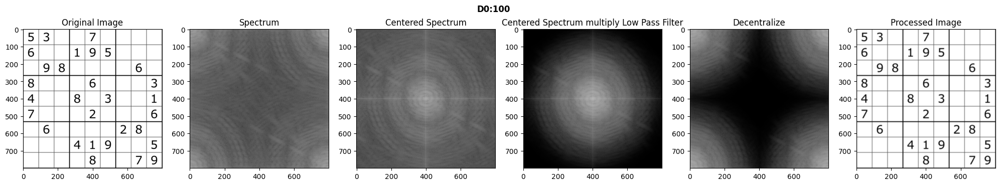

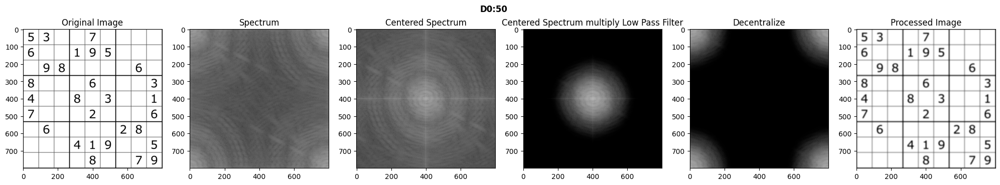

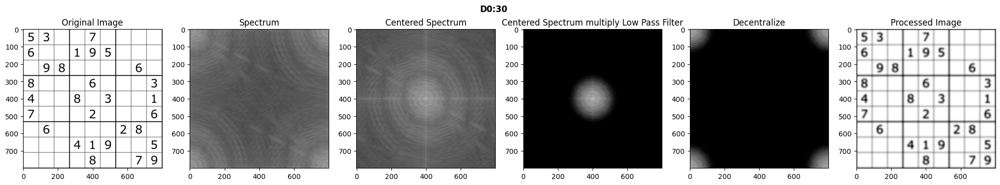

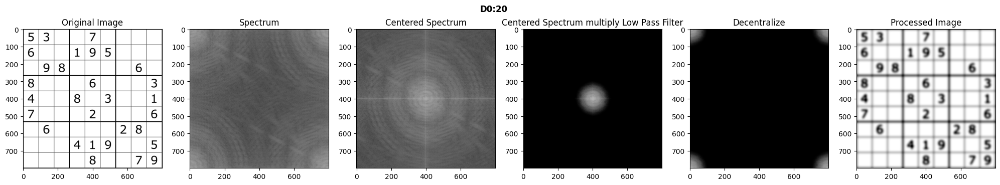

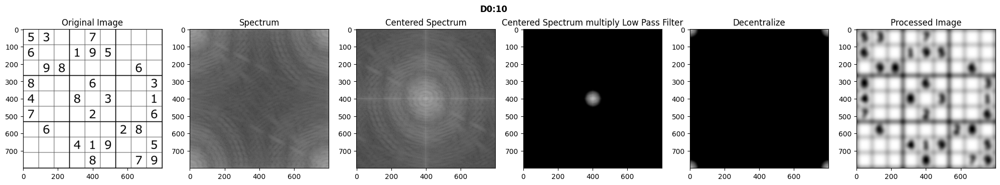

In [64]:
def try_d0s_lp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    LowPassCenter = center * gaussianLP(d0,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply Low Pass Filter")

    LowPass = np.fft.ifftshift(LowPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

    inverse_LowPass = np.fft.ifft2(LowPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()


img=gray_image
for i in [100,50,30,20,10]:
    try_d0s_lp(i)


## Χαμηλοπερατό φίλτρο τύπου Butterworth

In [65]:
def distance(point1,point2):
    return np.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def butterworthLP(D0,n,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1/(1+ (distance((y,x),center)/D0)**(2*n) )
    return base

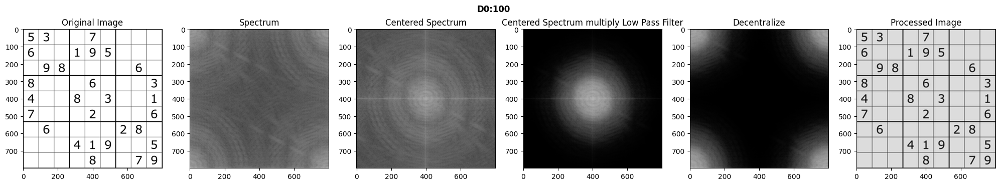

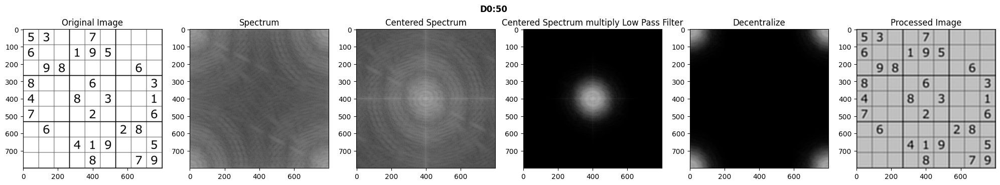

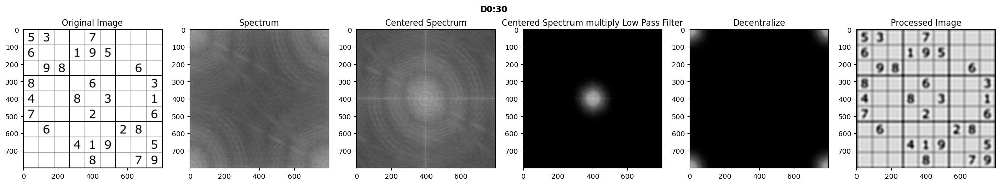

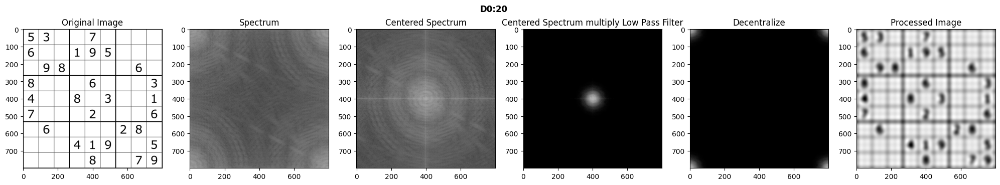

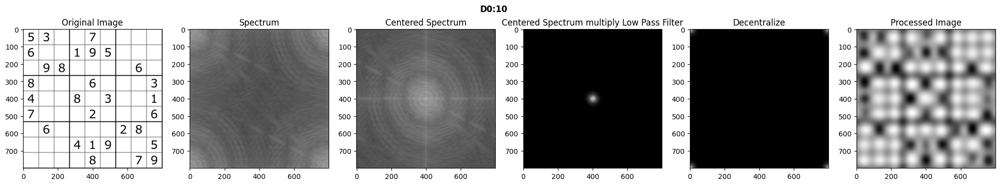

In [66]:
def try_d0s_lp(d0,n):

    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    LowPassCenter = center * butterworthLP(d0,4,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply Low Pass Filter")

    LowPass = np.fft.ifftshift(LowPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

    inverse_LowPass = np.fft.ifft2(LowPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()


img=gray_image
for i in [100,50,30,20,10]:
    n=2
    try_d0s_lp(i,n)

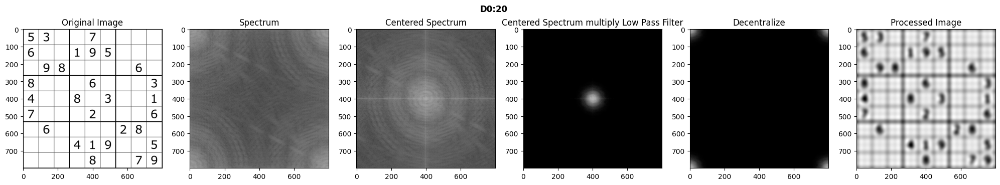

In [67]:
try_d0s_lp(20,3)

# Υψηλοπερατά φίλτρα στο πεδίο της συχνότητας

## Ιδανικό υψηλοπερατό φίλτρο

In [68]:
def idealHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
          if (distance((y,x),center)>D0):
            base[y,x] = 1
    return base

In [69]:
def try_d0s_hp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    HighPassCenter = center * idealHP(d0,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply High Pass Filter")

    HighPass = np.fft.ifftshift(HighPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

    inverse_HighPass = np.fft.ifft2(HighPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()


for i in [100,50,30,20,10]:
    try_d0s_hp(i)

Output hidden; open in https://colab.research.google.com to view.

## Υψηλοπερατό φιλτράρισμα με χρήση Gaussian φίλτρα

Το παρακάτω κομμάτι κώδικα δημιουργεί ένα υψηλοπερατό φίλτρο τύπου Gauss χρησιμοποιώντας την εξίσωση:
H_hp=1-H_lp

In [70]:
def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - np.exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

Το παρακάτω κομμάτι του κώδικα έχει ως σκοπό την δοκιμή διαφορετικών υψηλοπερατών φίλτρων τύπου Gauss σε μια εικόνα για διαφορετικές τιμές της παραμέτρου D0=(100,50,30,20,10)


In [71]:
def try_d0s_hp(d0):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    HighPassCenter = center * gaussianHP(d0,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply High Pass Filter")

    HighPass = np.fft.ifftshift(HighPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

    inverse_HighPass = np.fft.ifft2(HighPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()


for i in [100,50,30,20,10]:
    try_d0s_hp(i)

Output hidden; open in https://colab.research.google.com to view.

## Ανωδιαβατά φίλτρα τύπου Butterworth

In [72]:
def butterworthHP(D0,n, imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 / (1+ (D0/distance((y,x),center))**(2*n))
    return base

In [73]:
def try_d0s_hp(d0,n):
    plt.figure(figsize=(25, 5), constrained_layout=False)


    plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

    original = np.fft.fft2(img)
    plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

    center = np.fft.fftshift(original)
    plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

    HighPassCenter = center * butterworthHP(d0,n,img.shape)
    plt.subplot(164), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply High Pass Filter")

    HighPass = np.fft.ifftshift(HighPassCenter)
    plt.subplot(165), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

    inverse_HighPass = np.fft.ifft2(HighPass)
    plt.subplot(166), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

    plt.suptitle("D0:"+str(d0),fontweight="bold")
    plt.subplots_adjust(top=1.1)
    plt.show()


for i in [100,50,30,20,10]:
    n=8
    try_d0s_hp(i,n)

Output hidden; open in https://colab.research.google.com to view.

# Δημιουργία φίλτρων εγκοπής (notch filters)

## Δημιουργία του θορύβου

Εδώ θα δημιουργήσουμε τεχνητό περιοδικό θόρυβο και θα προσπαθήσουμε να τον αφαιρέσουμε χρησιμοποιώντας ένα φίλτρο εγκοπής

In [74]:
def add_periodic_freq(img, noise_coords=[(20, 10)], amplitudes=[100]):
    """
    Add periodic noise working with centered frequency coordinates
    Noise coordinates are specified relative to DC (center of spectrum)
    Both positive and negative frequencies can be used
    """
    # Normalize input image to [0,1] range
    img_normalized = img.astype(float) / np.max(img)

    sh = img.shape
    center_y, center_x = sh[0]//2, sh[1]//2

    # Create empty spectrum (already shifted so DC is at center)
    noise_spectrum = np.zeros(sh, dtype=complex)

    # Add peaks in frequency domain (spectrum is already centered)
    for (x, y), A in zip(noise_coords, amplitudes):
        # Add directly at coordinates relative to center
        noise_spectrum[center_y + y, center_x + x] = A
        # Add conjugate peak for real signal
        noise_spectrum[center_y - y, center_x - x] = A

    # Generate noise in spatial domain (need to unshift before IFFT)
    noise = np.real(np.fft.ifft2(np.fft.ifftshift(noise_spectrum)))

    # Normalize noise to have same scale as image
    noise_normalized = noise / np.max(np.abs(noise))

    # Add noise with controllable strength
    noise_strength = 0.3  # Adjust this value to control noise visibility (0.0 to 1.0)
    noisy_image = img_normalized + noise_normalized * noise_strength

    # Rescale back to original image range
    noisy_image = (noisy_image - np.min(noisy_image)) / (np.max(noisy_image) - np.min(noisy_image))
    noisy_image = noisy_image * np.max(img)

    return noisy_image.astype(img.dtype), noise_spectrum

def visualize_periodic_noise(img, noise_coords=[(20, 10)], amplitudes=[100]):
    noisy_img, noise_spectrum = add_periodic_freq(img, noise_coords, amplitudes)

    plt.figure(figsize=(15, 15))

    # Show noise spectrum (already centered)
    plt.subplot(231)
    plt.imshow(np.log(1 + np.abs(noise_spectrum)), cmap='gray')
    plt.title('Noise Spectrum (Centered)')
    plt.axhline(y=img.shape[0]//2, color='r', linestyle='--', alpha=0.3)
    plt.axvline(x=img.shape[1]//2, color='r', linestyle='--', alpha=0.3)

    # Original spectrum
    plt.subplot(232)
    orig_spectrum = np.fft.fftshift(np.fft.fft2(img))
    plt.imshow(np.log(1 + np.abs(orig_spectrum)), cmap='gray')
    plt.title('Original Image Spectrum')
    plt.axhline(y=img.shape[0]//2, color='r', linestyle='--', alpha=0.3)
    plt.axvline(x=img.shape[1]//2, color='r', linestyle='--', alpha=0.3)

    # Noisy image spectrum
    plt.subplot(233)
    noisy_spectrum = np.fft.fftshift(np.fft.fft2(noisy_img))
    plt.imshow(np.log(1 + np.abs(noisy_spectrum)), cmap='gray')
    plt.title('Noisy Image Spectrum')
    plt.axhline(y=img.shape[0]//2, color='r', linestyle='--', alpha=0.3)
    plt.axvline(x=img.shape[1]//2, color='r', linestyle='--', alpha=0.3)

    # Show noise pattern
    plt.subplot(234)
    noise = noisy_img - img
    plt.imshow(noise, cmap='gray')
    plt.title('Noise')

    # Original image
    plt.subplot(235)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')

    # Noisy image
    plt.subplot(236)
    plt.imshow(noisy_img, cmap='gray')
    plt.title('Image with Periodic Noise')

    plt.tight_layout()
    plt.show()

    return noisy_img


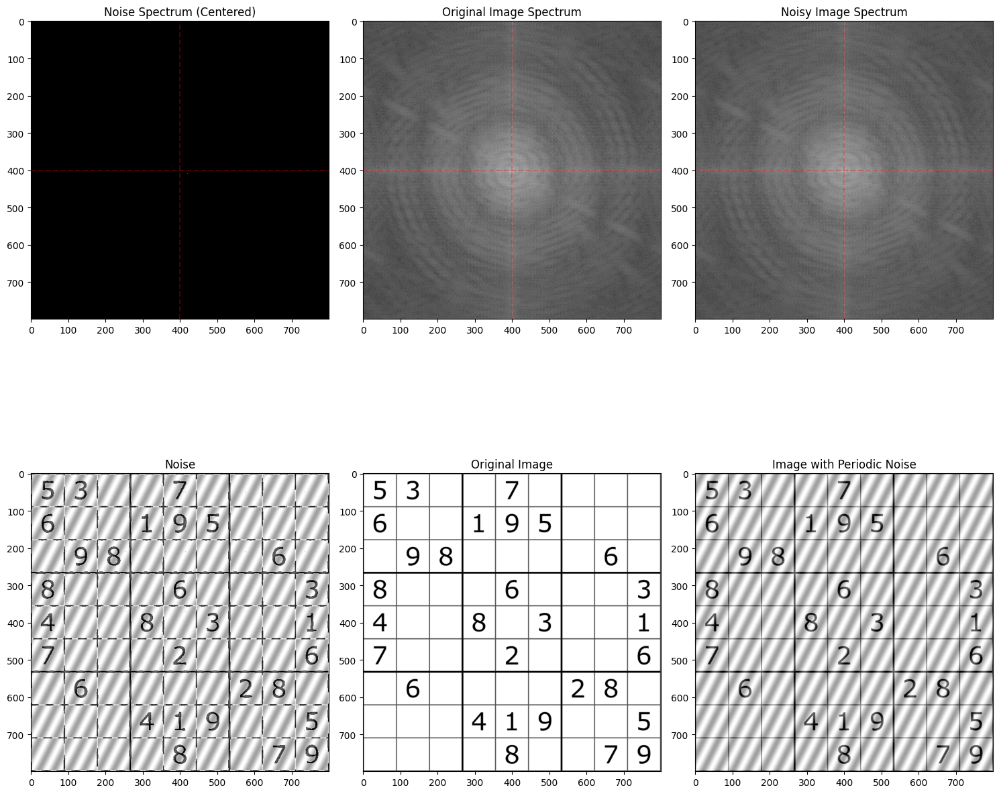

In [75]:
# Single noise component
noisy_img = visualize_periodic_noise(gray_image,
                                   noise_coords=[(20, 10)],
                                   amplitudes=[100])

# Or multiple noise components
#noisy_img = visualize_periodic_noise(gray_image,
#                                   noise_coords=[(20, 10), (-45, 50)],
#                                   amplitudes=[100, -18])

## Αφαίρεση του περιοδικού θορύβου

Εδώ θα κατασκευάσουμε το notch φίλτρο στις περιοχές που βλέπουμε από το φάσμα της εικόνας με τον περιοδικό θόρυβο.

In [76]:
def create_notch_filter(shape, notch_coords, a1=0.008, a2=0.008):
    """
    Create notch filter for specific frequencies
    notch_coords: List of (x, y) coordinates relative to center where to place notches
    """
    N, M = shape
    center_y, center_x = N//2, M//2
    x, y = np.meshgrid(np.arange(M), np.arange(N))

    # Initialize filter as ones
    Z = np.ones((N, M))

    # Add gaussian notches for each coordinate
    for x_coord, y_coord in notch_coords:
        notch = 1 - np.exp(-a1*(x-(center_x+x_coord))**2 - a2*(y-(center_y+y_coord))**2)
        Z *= notch
        # Add symmetric notch
        notch_sym = 1 - np.exp(-a1*(x-(center_x-x_coord))**2 - a2*(y-(center_y-y_coord))**2)
        Z *= notch_sym

    return Z

def apply_notch_filter(img, notch_coords, a1=0.008, a2=0.008):
    """
    Apply notch filter to remove periodic noise
    """
    # Get Fourier transform and shift DC to center
    F = np.fft.fft2(img)
    Fs = np.fft.fftshift(F)

    # Create and apply filter
    Z = create_notch_filter(img.shape, notch_coords, a1, a2)
    Filtered = Fs * Z

    # Inverse transform
    filtered_shifted = np.fft.ifftshift(Filtered)
    filtered_img = np.real(np.fft.ifft2(filtered_shifted))

    return filtered_img, Z

def visualize_complete_process(img, noisy_img,noise_coords=[(20, 10)], amplitudes=[100], a1=0.008, a2=0.008):
    # Apply filter
    filtered_img, notch_filter = apply_notch_filter(noisy_img, noise_coords, a1, a2)

    # Visualize results
    plt.figure(figsize=(10, 10))

    # Original noisy image
    plt.subplot(221)
    plt.title('Image with Periodic Noise')
    plt.imshow(noisy_img, cmap='gray')
    plt.axis('off')

    # Notch filter
    plt.subplot(222)
    plt.title('Notch Filter')
    plt.imshow(np.log(1 + np.abs(notch_filter)), cmap='gray')
    plt.axis('off')

    # Filtered result
    plt.subplot(223)
    plt.title('Filtered Image')
    plt.imshow(filtered_img, cmap='gray')
    plt.axis('off')

    # Spectrum after filtering
    plt.subplot(224)
    plt.title('Spectrum After Filtering')
    filtered_spectrum = np.fft.fftshift(np.fft.fft2(filtered_img))
    plt.imshow(np.log(1 + np.abs(filtered_spectrum)), cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    return noisy_img, filtered_img

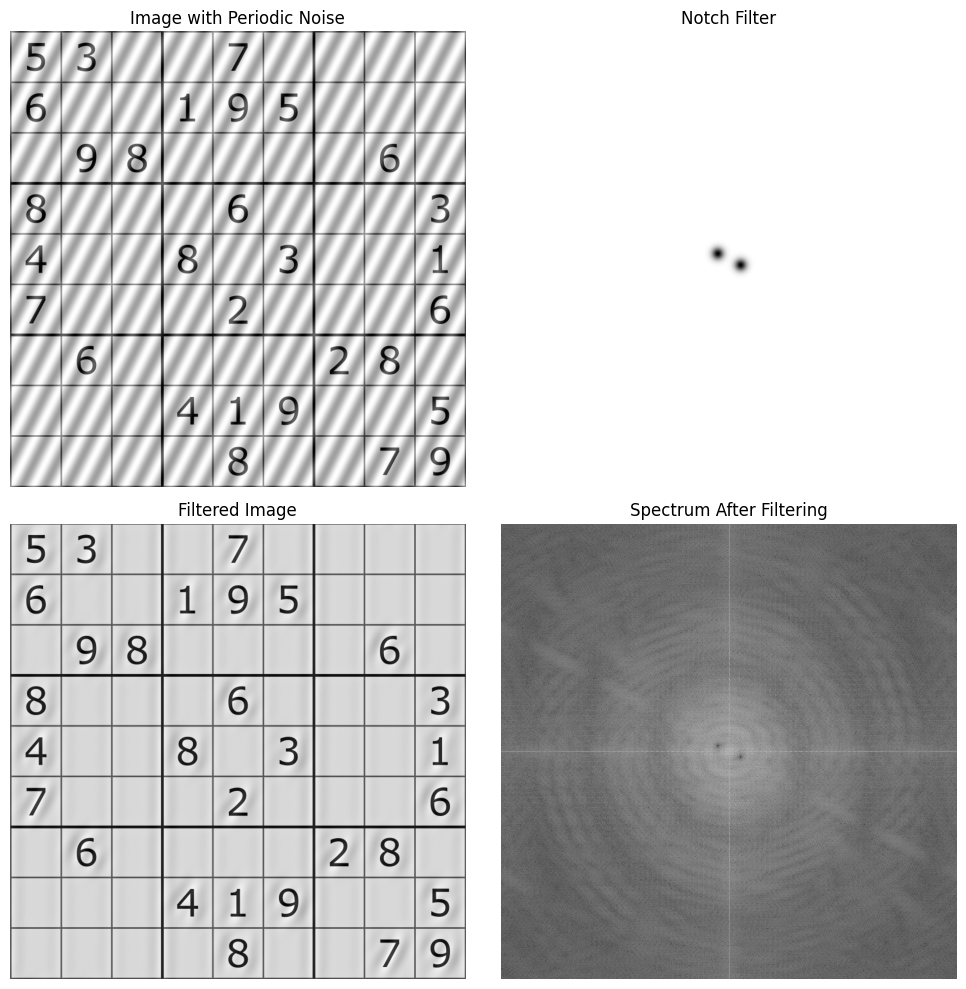

In [77]:
# Example usage
noise_coords = [(20, 10)]  # Coordinates relative to center
amplitudes = [100]
a1, a2 = 0.008, 0.008     # Filter parameters

# Process and visualize
filtered_img = visualize_complete_process(
    gray_image,
    noisy_img,
    noise_coords=noise_coords,
    amplitudes=amplitudes,
    a1=a1,
    a2=a2
)

## Δοκιμή με άλλες εικόνες

Δοκιμάστε να εφαρμόσετε παρόμοια τεχνική για να αφαιρέσετε τον περιοδικό θόρυβο από τις 3 εικόνες που φαίνονται παρακάτω:

# Φίλτρα ανίχνευσης ακμών στο πεδίο της συχνότητας

## Αναπαράσταση φίλτρων του χωρικού πεδίου στο πεδίο της συχνότητας

Εδώ θα δούμε πως είναι τα βασικά υψηλοπερατά φίλτρα στο πεδίο της συχνότητας. Έχουμε δει στον χώρο βασικές κατηγορίες ανωδιαβατών φίλτρων όπως είναι το φίλτρο Sobel, Laplacian και Scharr. Για να μπορέσουμε να δούμε την απόκριση συχνότητας αυτών των φίλτρων το μόνο που χρειάζεται να κάνουμε είναι να χρησιμοποιήσουμε τον μετασχηματισμό Fourier στους πυρήνες των φίλτρων αυτών.

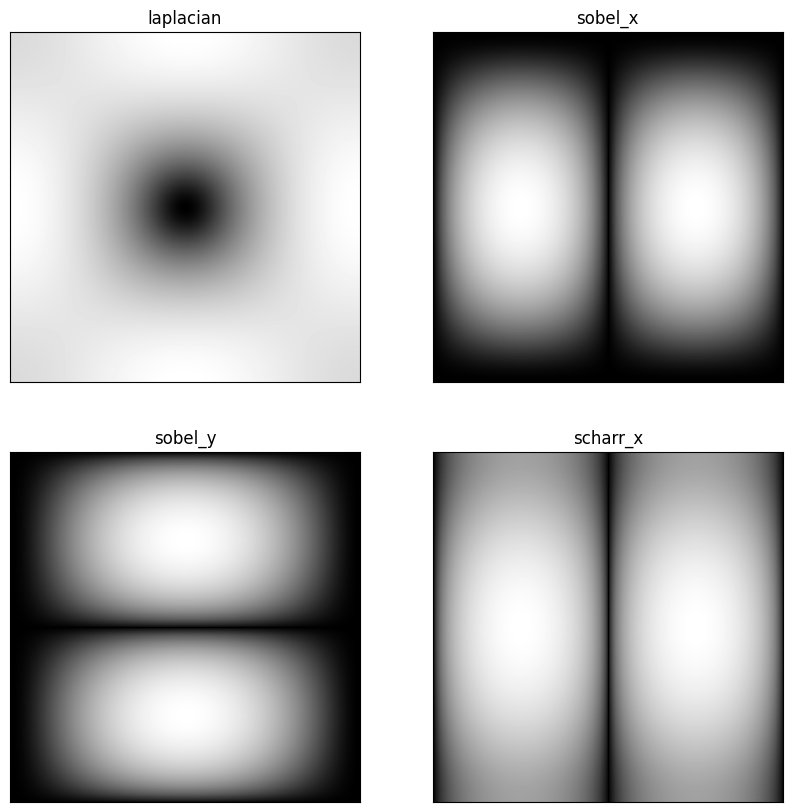

In [78]:
# scharr in x-direction
scharr = np.array([[-3, 0, 3],
                   [-10,0,10],
                   [-3, 0, 3]])

# sobel in x direction
sobel_x= np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])

# sobel in y direction
sobel_y= np.array([[-1,-2,-1],
                   [0, 0, 0],
                   [1, 2, 1]])
# laplacian
laplacian=np.array([[1, 1, 1],
                    [1,-8, 1],
                    [1, 1, 1]])
filters = [laplacian, sobel_x, sobel_y, scharr]
filter_name = ['laplacian', 'sobel_x', \
                'sobel_y', 'scharr_x']

fft_filters = [np.fft.fft2(x, s=(300,300)) for x in filters]
fft_shift = [np.fft.fftshift(y) for y in fft_filters]
mag_spectrum = [np.log(np.abs(z)+1) for z in fft_shift]

plt.figure(figsize=(10, 10), constrained_layout=False)
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(mag_spectrum[i],cmap = 'gray')
    plt.title(filter_name[i]), plt.xticks([]), plt.yticks([])
plt.show()


## Εφαρμογή φίλτρου Laplace στο πεδίο της συχνότητας

In [79]:
def laplacian(imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = -4*(np.pi)**2*((y-center[0])**2+(x-center[1])**2)-4*((np.pi)**2)*(distance((y,x),center))
    return base

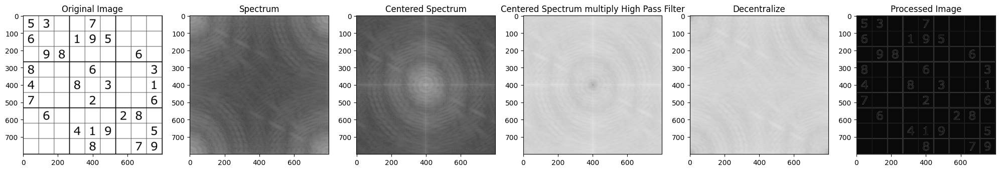

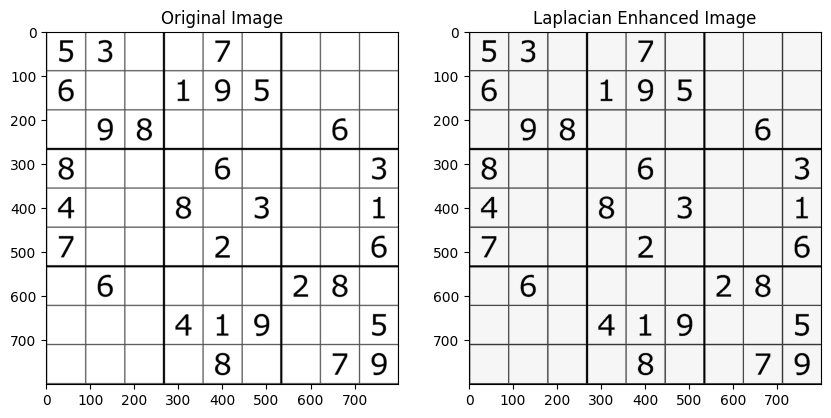

In [80]:
plt.figure(figsize=(25, 5), constrained_layout=False)

# Επειδή έχω υπολογισμούς, θα πρέπει την αρχική εικόνα να την κανονικοποιήσω στο [0,1]
norm_img = img/255.

plt.subplot(161), plt.imshow(norm_img, "gray"), plt.title("Original Image")


original = np.fft.fft2(img)
plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

center = np.fft.fftshift(original)
plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

LaplaceCenter = center * laplacian(img.shape)
plt.subplot(164), plt.imshow(np.log(1+np.abs(LaplaceCenter)), "gray"), plt.title("Centered Spectrum multiply High Pass Filter")

Laplace = np.fft.ifftshift(LaplaceCenter)
plt.subplot(165), plt.imshow(np.log(1+np.abs(Laplace)), "gray"), plt.title("Decentralize")

inverse_Laplace = np.fft.ifft2(Laplace)
inverse_Laplace = np.real(inverse_Laplace)

# Επειδή οι τιμές είναι σε μεγάλη κλίμακα, θα πρέπει να τις φέρουμε στο [-1 1]
old_range=np.max(inverse_Laplace)-np.min(inverse_Laplace)
new_range=1-(-1)
Lap_scaled = ((inverse_Laplace-np.min(inverse_Laplace))/old_range)*new_range + (-1)
plt.subplot(166), plt.imshow(np.abs(Lap_scaled), "gray"), plt.title("Processed Image")
plt.subplots_adjust(top=1.1)
plt.show()


c = -1
final_image = norm_img + c* (Lap_scaled)
final_image = np.clip(final_image, 0, 1) #αποκόβω τις τιμές που είναι εκτός 0-1

plt.figure(figsize=(10, 10), constrained_layout=False)
plt.subplot(121), plt.imshow(norm_img, "gray"), plt.title("Original Image")
plt.subplot(122), plt.imshow(final_image, "gray"), plt.title("Laplacian Enhanced Image")
plt.show()


# Αφαίρεση εξομάλυνσης και Ενισχυτικό φιλτράρισμα εικόνας

Εδώ θα δοκιμάσουμε την εφαρμογή των ανωδιαβατών φίλτρων για την αφαίρεση της εξομάλυνσης. Η εφαρμογή απαιτεί επιλογή μιας παραμέτρου k για το ενισχυτικό φιλτράρισμα της εικόνας. Η παρακάτω εφαρμογή των φίλτρων και τεχνικών παρουσιάζεται τόσο στο χωρικό πεδίο, όσο και στο πεδίο της συχνότητας

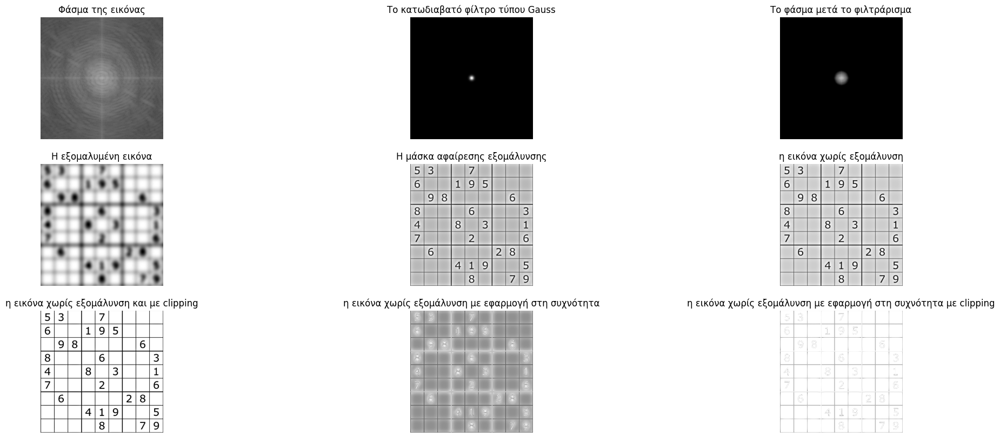

In [81]:
plt.figure(figsize=(25, 10), constrained_layout=False)


# input image in frequency domain, F(u,v)
F = np.fft.fftshift(np.fft.fft2(img))

plt.subplot(331), plt.imshow(np.log1p(np.abs(F)), cmap='gray'), plt.title('Φάσμα της εικόνας')
plt.axis('off')

# Gaussian Low Pass Filter
M,N = F.shape
H = np.zeros((M,N), dtype=np.float32)
D0 = 10
for u in range(M):
    for v in range(N):
        D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
        H[u,v] = np.exp(-D**2/(2*D0*D0))

plt.subplot(332), plt.imshow(H, cmap='gray'), plt.title('Το κατωδιαβατό φίλτρο τύπου Gauss')
plt.axis('off')


# create fLP(x,y) (smoothed image)
FLP = H * F

plt.subplot(333), plt.imshow(np.log1p(np.abs(FLP)), cmap='gray'), plt.title('Το φάσμα μετά το φιλτράρισμα')
plt.axis('off')
FLP = np.fft.ifftshift(FLP)
fLP = np.abs(np.fft.ifft2(FLP))

plt.subplot(334), plt.imshow(fLP, cmap='gray'), plt.title('Η εξομαλυμένη εικόνα')
plt.axis('off')


# create mask g(x,y)
gMask = img - fLP

plt.subplot(335), plt.imshow(gMask, cmap='gray'), plt.title('Η μάσκα αφαίρεσης εξομάλυνσης')
plt.axis('off')


# unsharp masking
k = 2
g = img + k*gMask

plt.subplot(336), plt.imshow(g, cmap='gray'), plt.title('η εικόνα χωρίς εξομάλυνση')
plt.axis('off')


g = np.clip(g, 0, 255)
plt.subplot(337), plt.imshow(g, cmap='gray'), plt.title('η εικόνα χωρίς εξομάλυνση και με clipping')
plt.axis('off')

# Unsharp Masking in Frequency Domain
G = (1 + k*(1-H))*F
g = np.abs(np.fft.ifft2(np.fft.ifftshift(G)))
plt.subplot(338), plt.imshow(g, cmap='gray'), plt.title('η εικόνα χωρίς εξομάλυνση με εφαρμογή στη συχνότητα')
plt.axis('off')


g = np.clip(g, 0, 255)
plt.subplot(339), plt.imshow(g, cmap='gray'), plt.title('η εικόνα χωρίς εξομάλυνση με εφαρμογή στη συχνότητα με clipping')
plt.axis('off')
plt.show()

# Φιλτράρισμα με έμφαση στις υψηλές συχνότητες

Όπως αναφέρεται στο βιβλίο, παρακάτω υλοποιούμε ένα φίλτρο που δίνει έμφαση στις υψηλές συχνότητες χωρίς όμως να χαλάει πολύ και τις άλλες συχνότητες

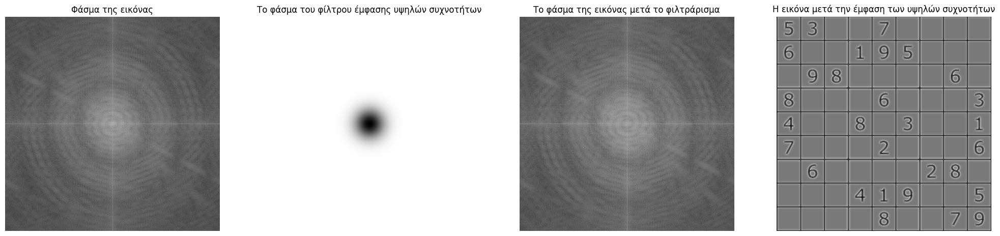

In [82]:
# input image in frequency domain, F(u,v)
F = np.fft.fftshift(np.fft.fft2(img))
plt.figure(figsize=(25, 10), constrained_layout=False)

plt.subplot(141), plt.imshow(np.log1p(np.abs(F)), cmap='gray'), plt.title('Φάσμα της εικόνας')
plt.axis('off')

# Υπολογισμός του ανωδιαβατού φίλτρου τύπου Gauss
(P, Q) = F.shape
H = np.zeros((P,Q))
D0 = 40
for u in range(P):
    for v in range(Q):
        H[u, v] = 1.0 - np.exp(- ((u - P / 2.0) ** 2 + (v - Q / 2.0) ** 2) / (2 * (D0 ** 2)))


# Υπολογισμός του φίλτρου έμφασης υψηλών συχνοτήτων
k1 = 0.5 ; k2 = .75

HFEfilt = k1 + k2 * H # Apply High-frequency emphasis
plt.subplot(142), plt.imshow(np.log1p(np.abs(HFEfilt)), cmap='gray'), plt.title('Το φάσμα του φίλτρου έμφασης υψηλών συχνοτήτων')
plt.axis('off')

# Apply HFE filter to FFT of original image
HFE = HFEfilt * F
plt.subplot(143), plt.imshow(np.log1p(np.abs(HFE)), cmap='gray'), plt.title('Το φάσμα της εικόνας μετά το φιλτράρισμα')
plt.axis('off')

HFE = np.fft.ifftshift(HFE)
hfe = np.abs(np.fft.ifft2(HFE))
plt.subplot(144), plt.imshow(hfe, cmap='gray'), plt.title('Η εικόνα μετά την έμφαση των υψηλών συχνοτήτων')
plt.axis('off')
plt.show()


Τελευταίο βήμα είναι να περάσουμε το αποτέλεσμα από ισοστάθμιση ιστογράμματος

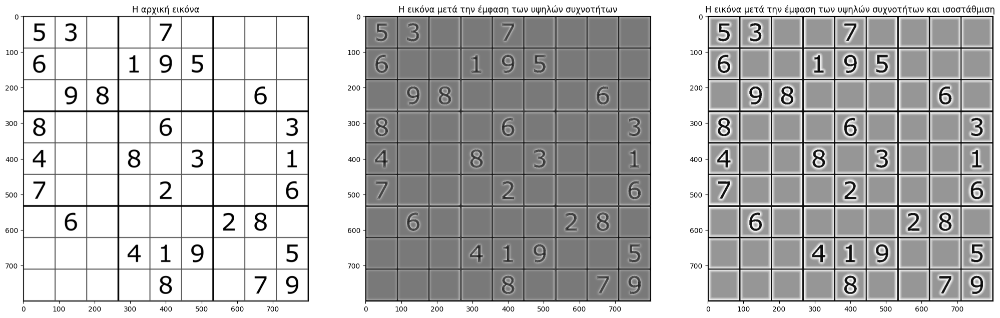

In [83]:
plt.figure(figsize=(25, 10), constrained_layout=False)

hfe_hist_eq = cv2.equalizeHist(hfe.astype(np.uint8))
plt.subplot(131),plt.imshow(img, cmap='gray'), plt.title('Η αρχική εικόνα')
plt.subplot(132),plt.imshow(hfe, cmap='gray'), plt.title('Η εικόνα μετά την έμφαση των υψηλών συχνοτήτων')
plt.subplot(133),plt.imshow(hfe_hist_eq, cmap='gray'), plt.title('Η εικόνα μετά την έμφαση των υψηλών συχνοτήτων και ισοστάθμιση')
plt.show()

Υπολογισμός των ιστογραμμάτων της αρχικής εικόνας και της τελικής μετά την έμφαση των υψηλών συχνοτήτων

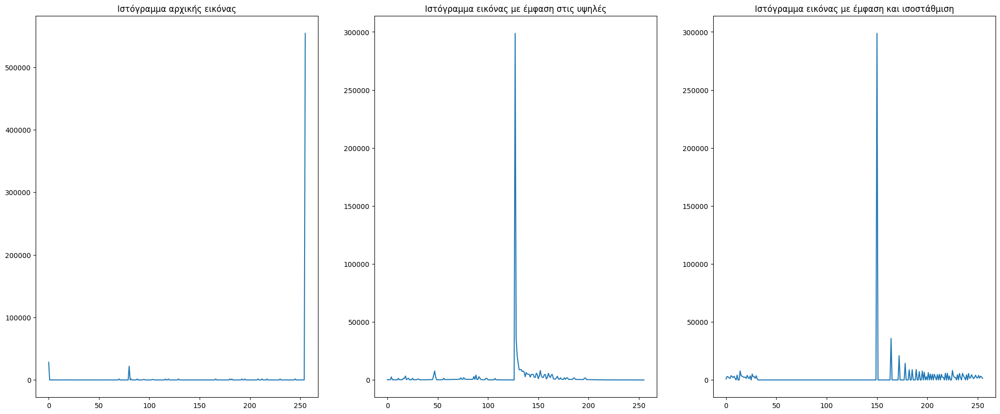

In [84]:
plt.figure(figsize=(25, 10), constrained_layout=False)

hist_or = cv2.calcHist([img],[0],None,[256],[0,256])
hist_hfe = cv2.calcHist([hfe.astype(np.uint8)],[0],None,[256],[0,256])
hist_eq = cv2.calcHist([hfe_hist_eq.astype(np.uint8)],[0],None,[256],[0,256])

plt.subplot(131),plt.plot(hist_or), plt.title('Ιστόγραμμα αρχικής εικόνας')
plt.subplot(132),plt.plot(hist_hfe), plt.title('Ιστόγραμμα εικόνας με έμφαση στις υψηλές')
plt.subplot(133),plt.plot(hist_eq), plt.title('Ιστόγραμμα εικόνας με έμφαση και ισοστάθμιση')

plt.show()